## Overview of the dataset
Here I will load the trial summary tables that include codes associated with Subjects and Activities

Subjects are grouped as follows

    SA: Adults subjects between 19 and 30 years old
    SE: Elderly people between 60 and 75 years old
    
Activities are grouped as follows

    F: Falls
    A: Activities of daily life (ADL)

In [13]:
import pandas as pd
import os
import glob
import numpy as np
import matplotlib.pyplot as plt

Load each of the summaries as dataframes to keep things organized.

In [2]:
def load_summary_as_df(fname):
    df = pd.read_csv(fname, sep='|', skipinitialspace=True)
    df.columns = df.columns.str.strip()
    for col in df.columns:
        if df[col].dtype.kind not in 'biufc':
            df[col] = df[col].str.strip()
    df.sort_values('ID')
    return df

subjects = load_summary_as_df("Subjects.txt")
activity = load_summary_as_df("Activities.txt")

Now load all trials for each combination of subjects and activities.

In [3]:
trial_dict = {}
for _s in subjects.ID:
    for _a in activity.ID:
        dpath = os.path.abspath(_s)
        fpath = os.path.join(dpath,_a)
        files = glob.glob("%s*.txt" % fpath)
        trial_dict[_s,_a] = []
        for _f in files:
            _t = os.path.split(_f)[-1].split('_')[-1].split('.')[0]
            trial_dict[_s,_a].append(_t)
        trial_dict[_s,_a].sort()
#         print(_s, _a, "has", len(trial_dict[_s,_a]), "trials")

Using `trial_dict` I can then count the total number of trials and access specific lists of trials for a given `trial_dict` key that is the pair of subject and activity IDs. We also need a consistent way to get the filepath, so I have included a function for that

1254 entries
5034 trials
0 entries without trials


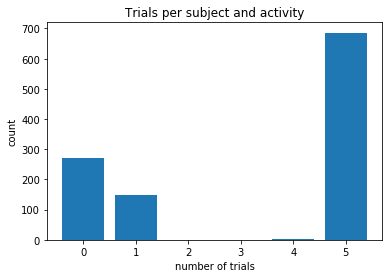

An example filepath: 
 /home/apatch/Documents/Insight/wobblewatch/data/SisFall_dataset/SA01/F03_SA01_R05.txt
For example...
Subject age 26
  Lateral fall while walking caused by a slip


In [111]:
def summarize_trials(trial_dict):
    total = 0
    notrial = 0
    n_trials = [[], []]
    for key in trial_dict.keys():
        _nt = len(trial_dict[key])
        total += _nt
        n_trials[0].append(_nt)
        if n_trials == 0:
            notrial += 1
    print(len(trial_dict.keys()), "entries")
    print(total, "trials")
    print(notrial, "entries without trials")

    n_trials = np.array(n_trials)
    plt.hist(n_trials[0], bins=[-0.5,0.5,1.5,2.5,3.5,4.5,5.5], 
             rwidth = 0.8, align='mid')
    plt.title("Trials per subject and activity")
    plt.xlabel("number of trials")
    plt.ylabel("count")
    plt.show()

# for example
summarize_trials(trial_dict)

def fpath(sub,act,trial):
    _fn = "%s_%s_%s.txt" % (act,sub,trial)
    _fp = os.path.abspath(sub)
    _fp = os.path.join(_fp,_fn)
    return _fp

# for example
sub, act = list(trial_dict.keys())[20]
trial = trial_dict[sub,act][-1]
print("An example filepath: \n", fpath(sub,act,trial))

def age_subject(subject_id):
    return int(subjects[subjects.ID == subject_id].Age)

def str_activity(activity_id):
    return activity.loc[activity.ID == activity_id]['Activity'].values[0]

print("For example...")
print("Subject age %i" % age_subject(sub))
print("  %s" % str_activity(act))

# Defining a trial class

This is pretty simple for now, but has the most basic components of what I'm calling the `Trial` class.

In [158]:
class Trial:
    
    def __init__(self, fname, age, action, trial_id,
                 fps = 200,
                 features = ["ax","ay","az",
                             "rx","ry","rz",
                             "ax2","ay2","az2"]):
        self.fname = fname
        self.df = pd.read_csv(fname, header=None)
        self.df.columns = features
        self.fps = fps
        self.age = age
        self.action = action
        self.id = trial_id
        
        self.fall = False
        if action[0] == 'F':
            self.fall = True

    def fpath(sub,act,trial):
        _fn = "%s_%s_%s.txt" % (act,sub,trial)
        _fp = os.path.abspath(sub)
        _fp = os.path.join(_fp,_fn)
        return _fp

    def print_info(self):
        print("  Trial Info")
        print("         age:", self.age)
        print("      action:", self.action)
        print("          ID:", self.id)
        print("         fps:", self.fps)
        print("       steps:", len(self.df))
        print("     time(s):", len(self.df)/self.fps)
        print("        file:", self.fname)
        #print("    features:", list(self.df.columns))
        print("\n")
        
    def plot(self, cols, title = None):
        for col in cols:
            plt.plot(self.df.index/self.fps, self.df[col], 
                     label = col)
            plt.xlabel("time (sec)")
            plt.ylabel("signal")
            plt.legend()
            plt.title(title)
        plt.show()
        plt.clf()
        
    def hist(self, cols, title = None):
        for col in cols:
            plt.hist(self.df[col], bins = 40, 
                     alpha = 0.5, label = col)
            plt.xlabel("signal")
            plt.ylabel("freq.")
            plt.legend()
            plt.title(title)
        plt.show()
        plt.clf()
        
    def get_features(self,cols):
        return self.df[cols].values, int(self.fall)
    
    def get_dataframe(self,cols):
        return self.df[cols]
    

trace = { 'ADXL345':  ['ax','ay','az'],
          'ITG3200':  ['rx','ry','rz'],
          'MMA8451Q': ['ax2','ay2','az2'] }

and I can just take this and define an instance of a `Trial` in the following ways...

In [100]:
sensors = ['ITG3200' ]
data_set = []
for _s in subjects.ID[subjects.ID.str.contains(r'SE', na=True)]:
    for _a in activity.ID:
        for _t in trial_dict[_s,_a]:
            try:
                _trial = Trial(fpath(_s,_a,_t),
                               age_subject(_s),
                               str_activity(_a), _t)
                #_trial.print_info()
                for sensor in sensors:
                    _ftr = _trial.get_features(trace[sensor])
                    if len(_ftr[0]) > 0:
                        data_set.append(np.array(_ftr))
            except FileNotFoundError:
                print("No file found for",_s,_a,_t)
data_set = np.array(data_set)

In [101]:
print(len(data_set))
# plt.plot(data_set[0][0][:,0])

923


In [104]:
sensors = ['ITG3200' ]

def collect_data_set(sensors, subject_sc = '', activity_sc = ''):
    data_set = []
    for _s in subjects.ID[subjects.ID.str.contains(
                                        r"%s" % subject_sc, na=True)]:
        for _a in activity.ID[activity.ID.str.contains(
                                        r"%s" % activity_sc, na=True)]:
            for _t in trial_dict[_s,_a]:
                try:
                    _trial = Trial(fpath(_s,_a,_t),
                                   age_subject(_s),
                                   str_activity(_a), _t)
#                     _trial.print_info()
                    for sensor in sensors:
                        _ftr = _trial.get_features(trace[sensor])
                        if len(_ftr[0]) > 0:
                            data_set.append(np.array(_ftr))
                except FileNotFoundError:
                    print("No file found for",_s,_a,_t)
        return np.array(data_set)

data_set = collect_data_set(sensors, activity_sc = 'F')

In [105]:
len(data_set)

105

In [38]:
print(data_set)

[[array([[ 84, 247,  27],
       [ 99, 258,  35],
       [114, 272,  45],
       ...,
       [-46,  16,   0],
       [-47,  18,   3],
       [-48,  18,   4]])
  1]
 [array([[ -24,  155, -119],
       [ -26,  189, -141],
       [ -39,  222, -171],
       ...,
       [ -53,   31,    5],
       [ -53,   32,    7],
       [ -52,   32,    6]])
  1]
 [array([[-154,   56,   41],
       [-140,   39,   67],
       [-123,   22,  100],
       ...,
       [ -55,   12,   16],
       [ -56,    8,   18],
       [ -56,    3,   19]])
  1]
 [array([[-706,  165,  245],
       [-835,  119,  336],
       [-884,   65,  433],
       ...,
       [ -47,   14,   -5],
       [ -48,   14,   -2],
       [ -46,   14,   -4]])
  1]
 [array([[-276,  435,  141],
       [-422,  369,  203],
       [-556,  285,  272],
       ...,
       [ -45,    2,    3],
       [ -47,    4,    3],
       [ -48,    6,    3]])
  1]
 [array([[ -27,  121, -208],
       [   1,   85, -207],
       [  27,   48, -208],
       ...,
       [ -61,

In [17]:
1723*10/60/60

4.786111111111111

In [106]:
walk_ids = []
for a_id in activity.ID[activity.ID.str.contains(r'F', na=True)]:
    description = str_activity(str(a_id))
    if 'walk' in description:
        print(a_id, description)
        walk_ids.append(a_id)
print("Walking and falling IDs: ", walk_ids )

F01 Fall forward while walking caused by a slip
F02 Fall backward while walking caused by a slip
F03 Lateral fall while walking caused by a slip
F04 Fall forward while walking caused by a trip
F06 Vertical fall while walking caused by fainting
F07 Fall while walking, with use of hands in a table to dampen fall, caused by fainting
Walking and falling IDs:  ['F01', 'F02', 'F03', 'F04', 'F06', 'F07']


In [112]:
td = {}
for _s in subjects.ID:
    for _a in walk_ids:
        dpath = os.path.abspath(_s)
        fp = os.path.join(dpath,_a)
        files = glob.glob("%s*.txt" % fp)
        td[_s,_a] = []
        for _f in files:
            _t = os.path.split(_f)[-1].split('_')[-1].split('.')[0]
            try:
                with open(_f) as f:
                    _ = f.read()
                    td[_s,_a].append(_t)
            except IOError as x:
                if x.errno == errno.ENOENT:
                    print(_f, '- does not exist')
                elif x.errno == errno.EACCES:
                    print(_f, '- cannot be read')
                else:
                    print(_f, '- some other error')
        td[_s,_a].sort()
        
empty_keys = []
for key in td.keys():
    if len(td[key]) == 0:
        empty_keys.append(key)
        
for key in empty_keys:
    del td[key]
#         print(_s, _a, "has", len(trial_dict[_s,_a]), "trials")

In [113]:
len(td)

144

In [114]:
total_trials = 0
for key in td:
    total_trials += len(td[key])
print(total_trials*10/60/60)

1.9972222222222222


In [124]:
data_set = []
for key in td:
    for tnum in td[key]:
        print(key[0],key[1],tnum)
        _s = key[0]
        _a = key[1]
        _t = tnum
        _trial = Trial(fpath(_s,_a,_t),
               age_subject(_s),
               str_activity(_a), _t)      
#          _trial.print_info()
        for sensor in sensors:
            _ftr, _fall = _trial.get_features(trace[sensor])
            if len(_ftr[0]) > 0:
                data_set.append(_ftr)


SA01 F01 R01
SA01 F01 R02
SA01 F01 R03
SA01 F01 R04
SA01 F01 R05
SA01 F02 R01
SA01 F02 R02
SA01 F02 R03
SA01 F02 R04
SA01 F02 R05
SA01 F03 R01
SA01 F03 R02
SA01 F03 R03
SA01 F03 R04
SA01 F03 R05
SA01 F04 R01
SA01 F04 R02
SA01 F04 R03
SA01 F04 R04
SA01 F04 R05
SA01 F06 R01
SA01 F06 R02
SA01 F06 R03
SA01 F06 R04
SA01 F06 R05
SA01 F07 R01
SA01 F07 R02
SA01 F07 R03
SA01 F07 R04
SA01 F07 R05
SA02 F01 R01
SA02 F01 R02
SA02 F01 R03
SA02 F01 R04
SA02 F01 R05
SA02 F02 R01
SA02 F02 R02
SA02 F02 R03
SA02 F02 R04
SA02 F02 R05
SA02 F03 R01
SA02 F03 R02
SA02 F03 R03
SA02 F03 R04
SA02 F03 R05
SA02 F04 R01
SA02 F04 R02
SA02 F04 R03
SA02 F04 R04
SA02 F04 R05
SA02 F06 R01
SA02 F06 R02
SA02 F06 R03
SA02 F06 R04
SA02 F06 R05
SA02 F07 R01
SA02 F07 R02
SA02 F07 R03
SA02 F07 R04
SA02 F07 R05
SA03 F01 R01
SA03 F01 R02
SA03 F01 R03
SA03 F01 R04
SA03 F01 R05
SA03 F02 R01
SA03 F02 R02
SA03 F02 R03
SA03 F02 R04
SA03 F02 R05
SA03 F03 R01
SA03 F03 R02
SA03 F03 R03
SA03 F03 R04
SA03 F03 R05
SA03 F04 R01
SA03 F04 R02

SA22 F06 R03
SA22 F06 R04
SA22 F06 R05
SA22 F07 R01
SA22 F07 R02
SA22 F07 R03
SA22 F07 R04
SA22 F07 R05
SA23 F01 R01
SA23 F01 R02
SA23 F01 R03
SA23 F01 R04
SA23 F01 R05
SA23 F02 R01
SA23 F02 R02
SA23 F02 R03
SA23 F02 R04
SA23 F02 R05
SA23 F03 R01
SA23 F03 R02
SA23 F03 R03
SA23 F03 R04
SA23 F03 R05
SA23 F04 R01
SA23 F04 R02
SA23 F04 R03
SA23 F04 R04
SA23 F04 R05
SA23 F06 R01
SA23 F06 R02
SA23 F06 R03
SA23 F06 R04
SA23 F06 R05
SA23 F07 R01
SA23 F07 R02
SA23 F07 R03
SA23 F07 R04
SA23 F07 R05
SE06 F01 R01
SE06 F01 R02
SE06 F01 R03
SE06 F01 R04
SE06 F01 R05
SE06 F02 R01
SE06 F02 R02
SE06 F02 R03
SE06 F02 R04
SE06 F02 R05
SE06 F03 R01
SE06 F03 R02
SE06 F03 R03
SE06 F03 R04
SE06 F03 R05
SE06 F04 R01
SE06 F04 R02
SE06 F04 R03
SE06 F04 R04
SE06 F04 R05
SE06 F06 R01
SE06 F06 R02
SE06 F06 R03
SE06 F06 R04
SE06 F06 R05
SE06 F07 R01
SE06 F07 R02
SE06 F07 R03
SE06 F07 R04
SE06 F07 R05


In [125]:
len(data_set)

719

In [130]:
data_set = list(data_set)

In [131]:
data_set

[array([[ 84, 247,  27],
        [ 99, 258,  35],
        [114, 272,  45],
        ...,
        [-46,  16,   0],
        [-47,  18,   3],
        [-48,  18,   4]]),
 array([[ -24,  155, -119],
        [ -26,  189, -141],
        [ -39,  222, -171],
        ...,
        [ -53,   31,    5],
        [ -53,   32,    7],
        [ -52,   32,    6]]),
 array([[-154,   56,   41],
        [-140,   39,   67],
        [-123,   22,  100],
        ...,
        [ -55,   12,   16],
        [ -56,    8,   18],
        [ -56,    3,   19]]),
 array([[-706,  165,  245],
        [-835,  119,  336],
        [-884,   65,  433],
        ...,
        [ -47,   14,   -5],
        [ -48,   14,   -2],
        [ -46,   14,   -4]]),
 array([[-276,  435,  141],
        [-422,  369,  203],
        [-556,  285,  272],
        ...,
        [ -45,    2,    3],
        [ -47,    4,    3],
        [ -48,    6,    3]]),
 array([[ -27,  121, -208],
        [   1,   85, -207],
        [  27,   48, -208],
        ...,
      

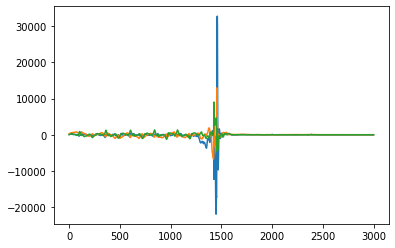

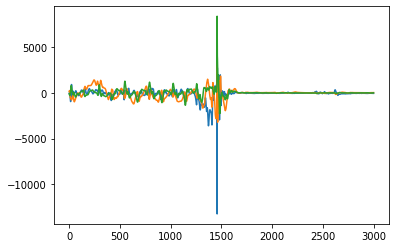

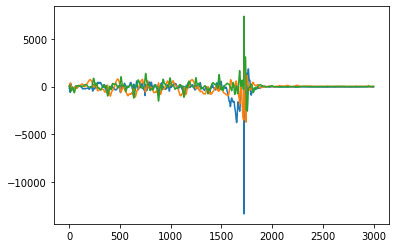

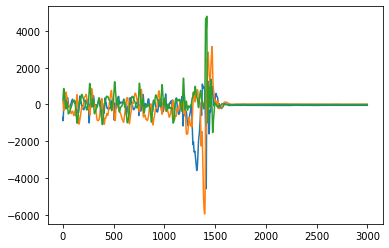

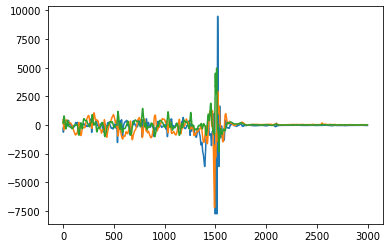

...

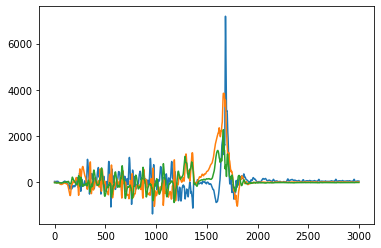

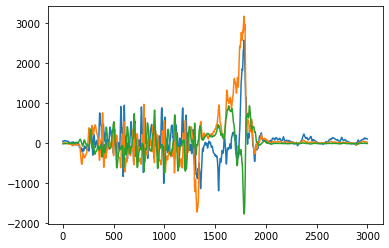

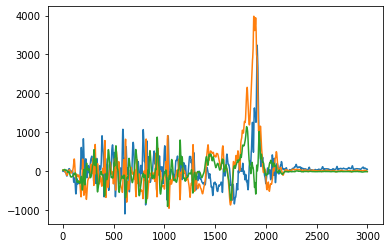

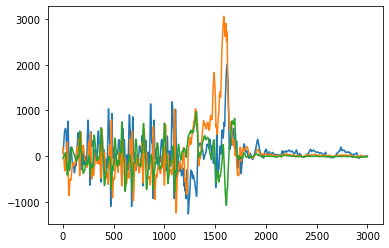

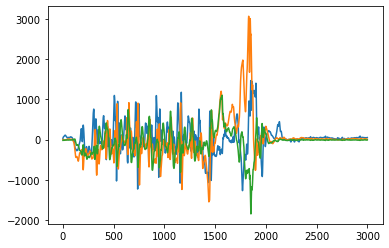

In [132]:
for entry in data_set:
    for i in range(3):
        plt.plot(entry[:,i])
    plt.show()

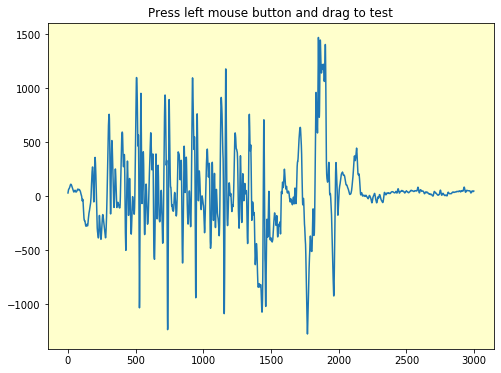

In [142]:
from matplotlib.widgets import SpanSelector

_trial = Trial(fpath(_s,_a,_t),
               age_subject(_s),
               str_activity(_a), _t)      

_ftr = _trial.get_dataframe(trace[sensor])

fig, ax = plt.subplots(1, figsize=(8, 6))
ax.set(facecolor='#FFFFCC')
ax.plot(_ftr.index, _ftr.rx, '-')
ax.set_title('Press left mouse button and drag to test')

def onselect(xmin, xmax):
    indmin, indmax = np.searchsorted(x, (xmin, xmax))
    indmax = min(len(x) - 1, indmax)

    thisx = x[indmin:indmax]
    thisy = y[indmin:indmax]
    line2.set_data(thisx, thisy)
    fig.canvas.draw()

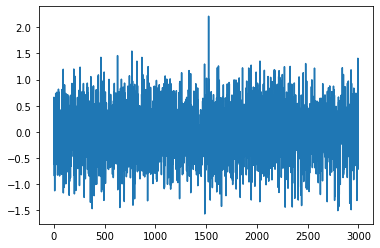

In [143]:
fig = plt.figure()
ax = fig.add_subplot(111)
ax.plot(x,y)

In [145]:
np.arange(0,10,0.1)

array([0. , 0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1. , 1.1, 1.2,
       1.3, 1.4, 1.5, 1.6, 1.7, 1.8, 1.9, 2. , 2.1, 2.2, 2.3, 2.4, 2.5,
       2.6, 2.7, 2.8, 2.9, 3. , 3.1, 3.2, 3.3, 3.4, 3.5, 3.6, 3.7, 3.8,
       3.9, 4. , 4.1, 4.2, 4.3, 4.4, 4.5, 4.6, 4.7, 4.8, 4.9, 5. , 5.1,
       5.2, 5.3, 5.4, 5.5, 5.6, 5.7, 5.8, 5.9, 6. , 6.1, 6.2, 6.3, 6.4,
       6.5, 6.6, 6.7, 6.8, 6.9, 7. , 7.1, 7.2, 7.3, 7.4, 7.5, 7.6, 7.7,
       7.8, 7.9, 8. , 8.1, 8.2, 8.3, 8.4, 8.5, 8.6, 8.7, 8.8, 8.9, 9. ,
       9.1, 9.2, 9.3, 9.4, 9.5, 9.6, 9.7, 9.8, 9.9])

In [146]:
df

NameError: name 'df' is not defined

In [148]:
subjects

,ID,Age,Height,Weight,Gender
0,SA01,26,165,53.0,F
1,SA02,23,176,58.5,M
2,SA03,19,156,48.0,F
3,SA04,23,170,72.0,M
4,SA05,22,172,69.5,M
5,SA06,21,169,58.0,M
6,SA07,21,156,63.0,F
7,SA08,21,149,41.5,F
8,SA09,24,165,64.0,M
9,SA10,21,177,67.0,M


In [157]:
subjects['ID'].values

array(['SA01', 'SA02', 'SA03', 'SA04', 'SA05', 'SA06', 'SA07', 'SA08',
       'SA09', 'SA10', 'SA11', 'SA12', 'SA13', 'SA14', 'SA15', 'SA16',
       'SA17', 'SA18', 'SA19', 'SA20', 'SA21', 'SA22', 'SA23', 'SE01',
       'SE02', 'SE03', 'SE04', 'SE05', 'SE06', 'SE07', 'SE08', 'SE09',
       'SE10', 'SE11', 'SE12', 'SE13', 'SE14', 'SE15'], dtype=object)